<a href="https://colab.research.google.com/github/vinothini0806/Agromonitor/blob/main/pump_data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
data = pd.read_csv('/content/drive/MyDrive/pump.csv')
# data['timestamp'] = pd.to_datetime(data['timestamp'])
data.head()

,Ident,Date,WorkingAge,DayBRdg,Life,HN,Precedence,Event,M1H_Gs,M1H_Overall,...,P2H_Par3,P2H_Par4,P2H_Par5,P2V_Gs,P2V_Overall,P2V_Par1,P2V_Par2,P2V_Par3,P2V_Par4,P2V_Par5
0,32-4165,36936,36936,0,0,1,70,B,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,32-4165,36937,36937,1,1,1,0,*,0.139,0.061,...,0.064,0.023,0.016,0.311,0.106,0.059,0.029,0.065,0.042,0.031
2,32-4165,36983,36983,46,47,1,0,*,0.350,0.046,...,0.047,0.023,0.015,0.204,0.077,0.042,0.025,0.039,0.038,0.025
3,32-4165,37007,37007,24,71,1,0,*,0.271,0.053,...,0.051,0.022,0.016,0.237,0.075,0.040,0.030,0.035,0.035,0.026
4,32-4165,37055,37055,48,119,1,0,*,0.199,0.056,...,0.060,0.028,0.019,0.262,0.100,0.045,0.028,0.051,0.056,0.039


##Equipement identifier

In [2]:
data['Ident'].unique()

array(['32-4165', '32-4167', '32-4174', '32-4180', '32-4208', '32-4210',
       '32-4222', '32-4242', '32-4246', '32-4276', '33-1002', '33-4012',
       '33-4802', '46-3001', '50-3116', '50-3124', '50-3143', '50-3144'],
      dtype=object)

In [3]:
# There are 18 unique pumps are there
data['Ident'].unique().shape

(18,)

##HN - Category for identifying bearing instances
There are 3 categories

In [4]:
data['HN'].unique()

array([1, 2, 3])

##Working age - period installation to now in days



In [5]:
data['WorkingAge'].max()

38412

In [6]:
data['Event'].unique()

array(['B', '*', 'EF', '*ES', 'ES'], dtype=object)

In [7]:
grouped_by_identification = data.groupby('Ident')

Plot 18 pumps vs their number of counts

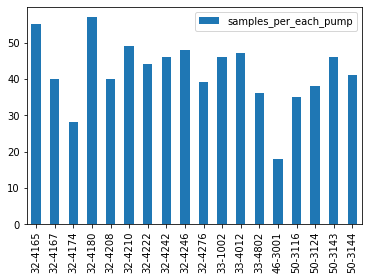

In [8]:
pump_count = pd.DataFrame({"samples_per_each_pump":[len(grouped_by_identification.get_group('32-4165')), len(grouped_by_identification.get_group('32-4167')), 
                                        len(grouped_by_identification.get_group('32-4174')), len(grouped_by_identification.get_group('32-4180')), 
                                        len(grouped_by_identification.get_group('32-4208')),len(grouped_by_identification.get_group('32-4210')),
                                        len(grouped_by_identification.get_group('32-4222')),len(grouped_by_identification.get_group('32-4242')),
                                        len(grouped_by_identification.get_group('32-4246')),len(grouped_by_identification.get_group('32-4276')),
                                        len(grouped_by_identification.get_group('33-1002')),len(grouped_by_identification.get_group('33-4012')),
                                        len(grouped_by_identification.get_group('33-4802')),len(grouped_by_identification.get_group('46-3001')),
                                        len(grouped_by_identification.get_group('50-3116')),len(grouped_by_identification.get_group('50-3124')),
                                        len(grouped_by_identification.get_group('50-3143')),len(grouped_by_identification.get_group('50-3144'))
                                        ]}, 
                                        index = ['32-4165', '32-4167', '32-4174', '32-4180', '32-4208', '32-4210',
                                                '32-4222', '32-4242', '32-4246', '32-4276', '33-1002', '33-4012',
                                                '33-4802', '46-3001', '50-3116', '50-3124', '50-3143', '50-3144'])

pump_count.plot.bar()

##Analysis the data by date

In [9]:
data['Date'].unique()

array([36936, 36937, 36983, 37007, 37055, 37083, 37123, 37159, 37181,
       37222, 37267, 37294, 37326, 37327, 37330, 37349, 37351, 37397,
       37404, 37409, 37410, 37426, 37452, 37510, 37543, 37573, 37623,
       37643, 37645, 37657, 37658, 37670, 37672, 37678, 37690, 37691,
       37692, 37693, 37694, 37698, 37708, 37721, 37755, 37817, 37881,
       37931, 37998, 38043, 38085, 38163, 38223, 38292, 38294, 38329,
       37586, 37587, 37588, 37818, 38092, 36945, 36980, 37005, 37006,
       37008, 37049, 37060, 37061, 37081, 37119, 37148, 37179, 37217,
       37266, 37293, 37321, 37350, 37391, 37421, 37447, 37497, 37538,
       37567, 37662, 37663, 36952, 36992, 37034, 37067, 37097, 37098,
       37132, 37167, 37202, 37204, 37243, 37277, 37281, 37306, 37307,
       37336, 37337, 37344, 37361, 37412, 37424, 37428, 37431, 37434,
       37441, 37442, 37448, 37449, 37461, 37515, 37522, 37559, 37592,
       37630, 37655, 37707, 37739, 37783, 37839, 37908, 37949, 37952,
       37953, 38013,

In [10]:
import xlrd
date1 = []
for i in data['Date']:
  datetime_date = xlrd.xldate_as_datetime(i, 0)
  
# Calling the datetime_date.date() function to convert
# the above returned datetime.datetime object into
# datetime.date object
  date_object = datetime_date.date()
  
# Calling the isoformat() function to convert the
# above returned datetime.date object into the
# ISO format date string
  string_date = date_object.isoformat()
  date1.append(string_date)
# date1

In [11]:
# from datetime import datetime, timedelta
# date = []
# for i in data['Date']:
#    date.append((datetime.utcfromtimestamp(0) + timedelta(i)).strftime("%Y-%m-%d"))
# # print((datetime.utcfromtimestamp(0) + timedelta(n)).strftime("%Y-%m-%d"))
# # data['Date'] = pd.to_datetime(data['Date'].astype(str), format='%Y%m%d')

In [12]:
max(date1)

'2005-03-01'

In [13]:
min(date1)

'2001-02-14'

In [14]:
data['Date'] = date1

Get unique dates

In [15]:
grouped_by_date = data.groupby('Date')
unique_dates = data['Date'].unique()
# unique_dates


Plot the dataset with all attributes

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fbee927bac0>,
      dtype=object)

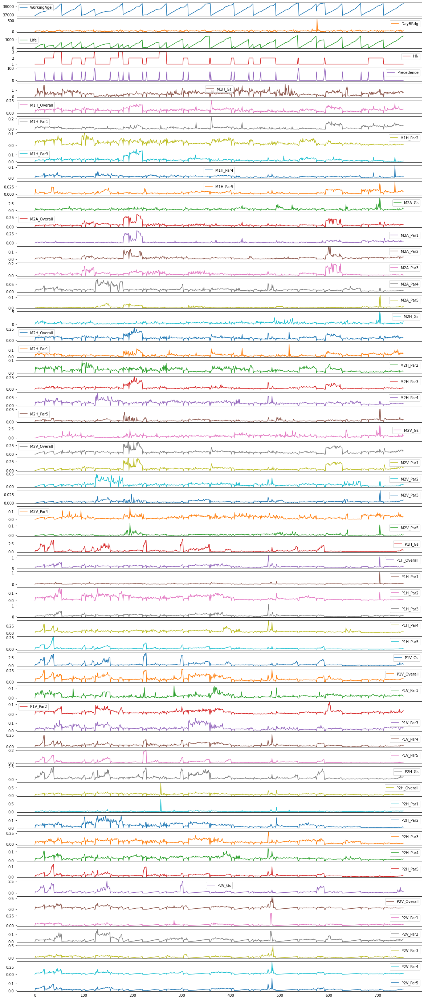

In [16]:
data.plot(subplots =True, sharex = True, figsize = (20,50))

##Calculate sampling rate in samplw per second unit

In [17]:
sampling_rate = []
for i in data['Ident'].unique():
  pump = grouped_by_identification.get_group(i)
  sampling_rate_pump = len(pump)/len(pump['Date'].unique())
  sampling_rate_pump = (sampling_rate_pump/24)/3600
  sampling_rate.append(sampling_rate_pump)

sampling_rate


[1.178840877914952e-05,
 1.1574074074074073e-05,
 1.2002743484224965e-05,
 1.1574074074074073e-05,
 1.1574074074074073e-05,
 1.1574074074074073e-05,
 1.1843238587424634e-05,
 1.1574074074074073e-05,
 1.1574074074074073e-05,
 1.1574074074074073e-05,
 1.1574074074074073e-05,
 1.1825684380032207e-05,
 1.1574074074074073e-05,
 1.2254901960784315e-05,
 1.1574074074074073e-05,
 1.1574074074074073e-05,
 1.1574074074074073e-05,
 1.1574074074074073e-05]

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17],
 <a list of 18 Text major ticklabel objects>)

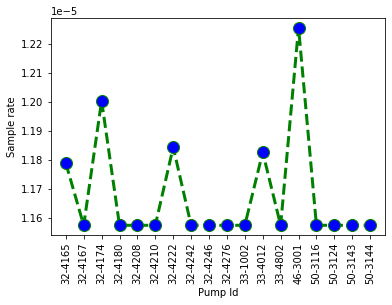

In [18]:
import matplotlib.pyplot as plt
plt.plot(data['Ident'].unique(), sampling_rate, color='green', linestyle='dashed', linewidth = 3,
         marker='o', markerfacecolor='blue', markersize=12)
# naming the x axis
plt.xlabel('Pump Id')
# naming the y axis
plt.ylabel('Sample rate')

plt.xticks(rotation=90)


In [19]:
data["Event"] = data["Event"].astype('category')
data["Event"] = data["Event"].cat.codes
data["Event"].unique()
data.head()

,Ident,Date,WorkingAge,DayBRdg,Life,HN,Precedence,Event,M1H_Gs,M1H_Overall,...,P2H_Par3,P2H_Par4,P2H_Par5,P2V_Gs,P2V_Overall,P2V_Par1,P2V_Par2,P2V_Par3,P2V_Par4,P2V_Par5
0,32-4165,2001-02-14,36936,0,0,1,70,2,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,32-4165,2001-02-15,36937,1,1,1,0,0,0.139,0.061,...,0.064,0.023,0.016,0.311,0.106,0.059,0.029,0.065,0.042,0.031
2,32-4165,2001-04-02,36983,46,47,1,0,0,0.350,0.046,...,0.047,0.023,0.015,0.204,0.077,0.042,0.025,0.039,0.038,0.025
3,32-4165,2001-04-26,37007,24,71,1,0,0,0.271,0.053,...,0.051,0.022,0.016,0.237,0.075,0.040,0.030,0.035,0.035,0.026
4,32-4165,2001-06-13,37055,48,119,1,0,0,0.199,0.056,...,0.060,0.028,0.019,0.262,0.100,0.045,0.028,0.051,0.056,0.039


##Feature importance of dataset

1. Variance Threshold method

In [30]:
data1 = data
data1['Ident'] = data1['Ident'].replace('-', '', regex=True).astype(int)
data1['Date'] = data1['Date'].replace('-', '', regex=True).astype(int)
from sklearn.feature_selection import VarianceThreshold

var_thr = VarianceThreshold(threshold = 0.25) #Removing both constant and quasi-constant
var_thr.fit(data1)

var_thr.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [31]:
data1.head()

,Ident,Date,WorkingAge,DayBRdg,Life,HN,Precedence,Event,M1H_Gs,M1H_Overall,...,P2H_Par3,P2H_Par4,P2H_Par5,P2V_Gs,P2V_Overall,P2V_Par1,P2V_Par2,P2V_Par3,P2V_Par4,P2V_Par5
0,324165,20010214,36936,0,0,1,70,2,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,324165,20010215,36937,1,1,1,0,0,0.139,0.061,...,0.064,0.023,0.016,0.311,0.106,0.059,0.029,0.065,0.042,0.031
2,324165,20010402,36983,46,47,1,0,0,0.350,0.046,...,0.047,0.023,0.015,0.204,0.077,0.042,0.025,0.039,0.038,0.025
3,324165,20010426,37007,24,71,1,0,0,0.271,0.053,...,0.051,0.022,0.016,0.237,0.075,0.040,0.030,0.035,0.035,0.026
4,324165,20010613,37055,48,119,1,0,0,0.199,0.056,...,0.060,0.028,0.019,0.262,0.100,0.045,0.028,0.051,0.056,0.039


In [32]:
concol = [column for column in data1.columns 
          if column not in data1.columns[var_thr.get_support()]]

# for features in concol:
#     print(features)
len(concol)

54

Important columns

In [33]:
imp_col = [column for column in data1.columns 
          if column in data1.columns[var_thr.get_support()]]
imp_col

['Ident',
 'Date',
 'WorkingAge',
 'DayBRdg',
 'Life',
 'HN',
 'Precedence',
 'Event',
 'P1H_Gs',
 'P1V_Gs']

##Pump Id 32-4165


Total date time for pump 1

In [34]:
grouped_by_identification1 = data1.groupby('Ident')
pump_1 = grouped_by_identification1.get_group(324165)
len(pump_1)
# pump_1

55

Working Age

In [51]:
pump_1['WorkingAge'].min()

36936

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fbe6ec757c0>,
      dtype=object)

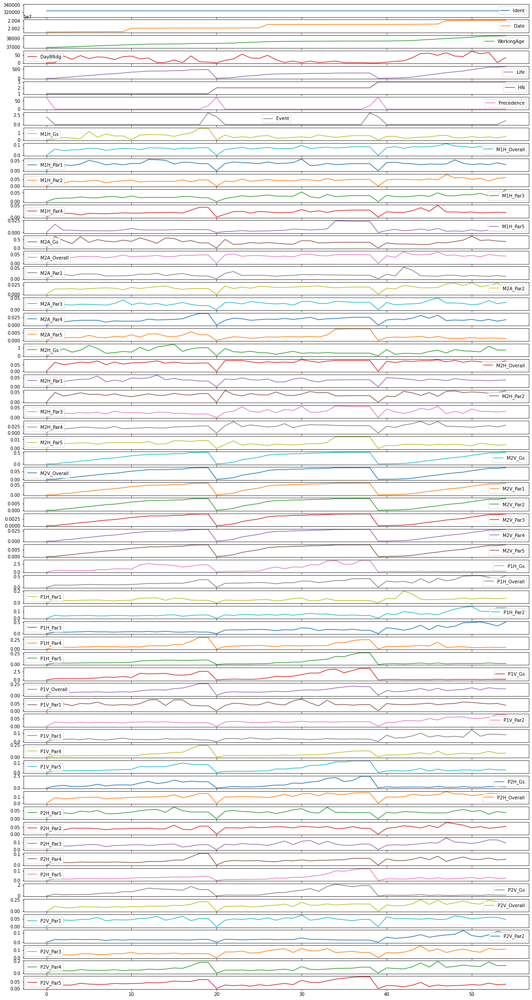

In [53]:
pump_1.plot(subplots =True, sharex = True, figsize = (20,40))

Correlation beween features for pump1

In [40]:

from sklearn.feature_selection import VarianceThreshold

var_thr = VarianceThreshold(threshold = 0.10) #Removing both constant and quasi-constant
var_thr.fit(pump_1)

var_thr.get_support()

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False,  True, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False])

In [41]:
concol = [column for column in pump_1.columns 
          if column not in pump_1.columns[var_thr.get_support()]]

# for features in concol:
#     print(features)
len(concol)

51

Importan features for pump 1

In [42]:
imp_col = [column for column in pump_1.columns 
          if column in pump_1.columns[var_thr.get_support()]]
imp_col

['Date',
 'WorkingAge',
 'DayBRdg',
 'Life',
 'HN',
 'Precedence',
 'Event',
 'M1H_Gs',
 'M2H_Gs',
 'P1H_Gs',
 'P1V_Gs',
 'P2H_Gs',
 'P2V_Gs']

In [44]:
# from pandas.plotting import scatter_matrix

# scatter_matrix(pump_1, figsize=(12, 8))

##Pump Id 32-4167

In [45]:
grouped_by_identification1 = data1.groupby('Ident')
pump_2 = grouped_by_identification1.get_group(324167)
len(pump_2)
# pump_1

40

Pump Age

In [52]:
pump_2['WorkingAge'].min()

36936

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fbe6f1eda90>,
      dtype=object)

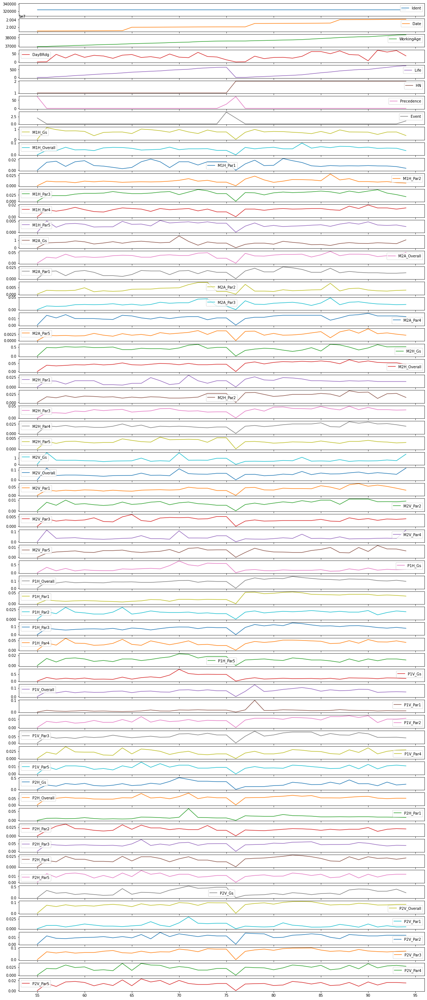

In [46]:
pump_2.plot(subplots =True, sharex = True, figsize = (20,50))

Plot age and sensors readings for all 18 pumps

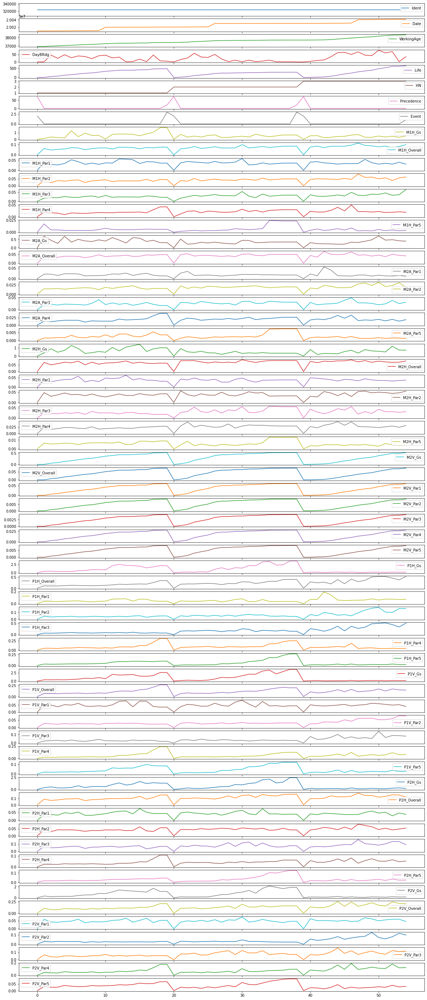

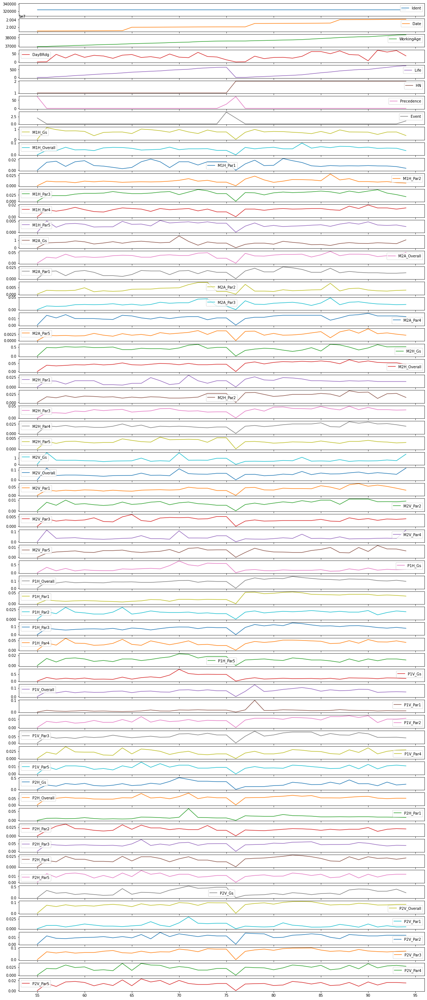

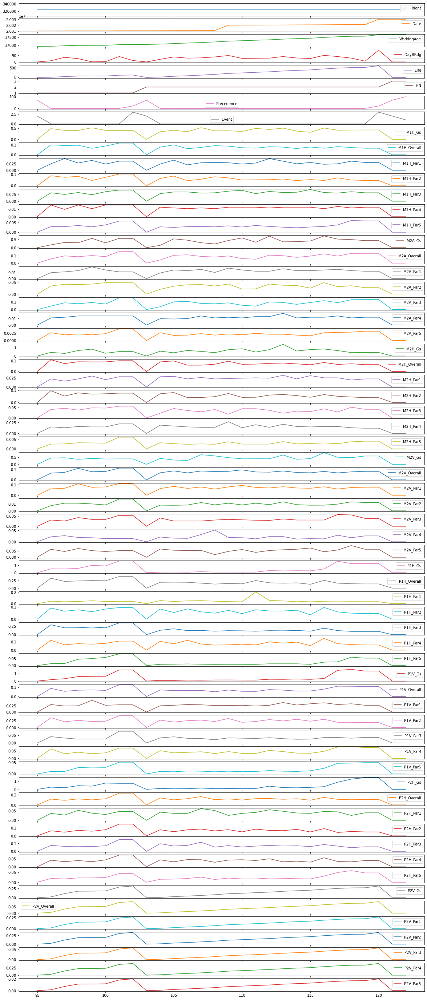

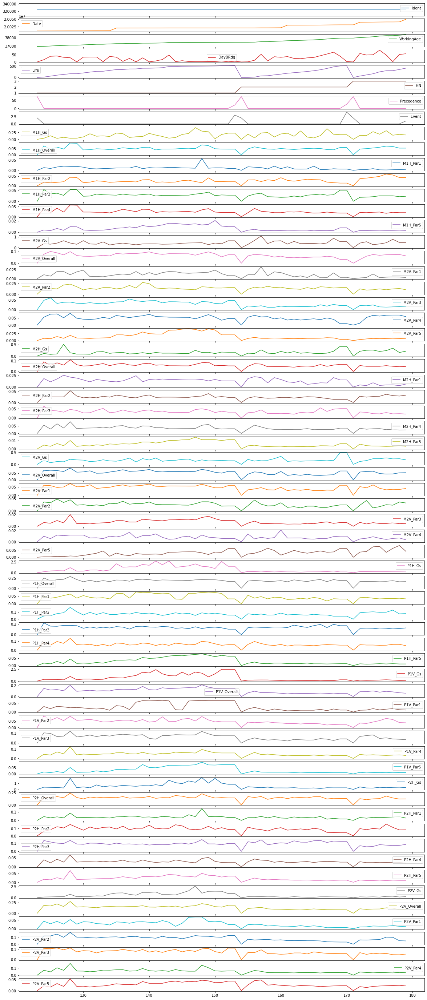

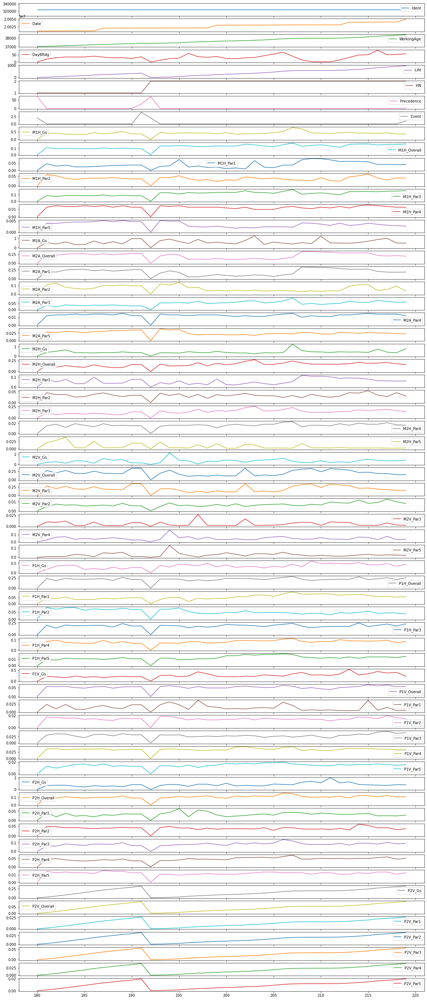

...

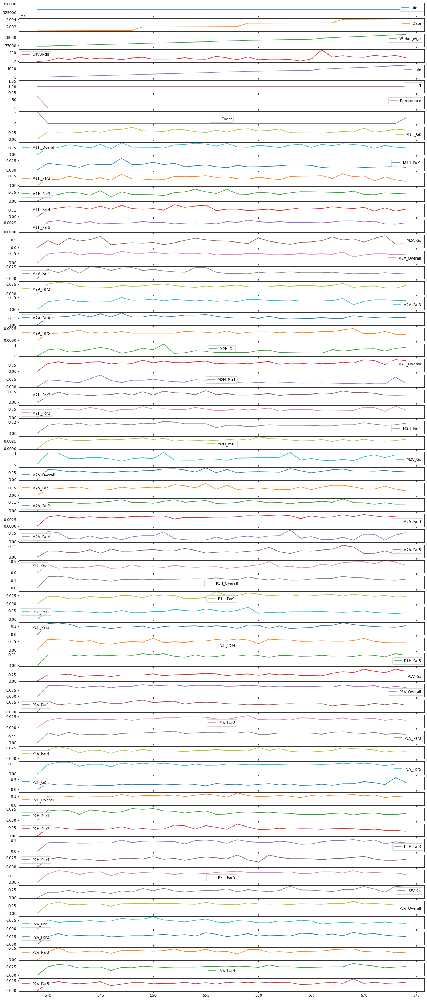

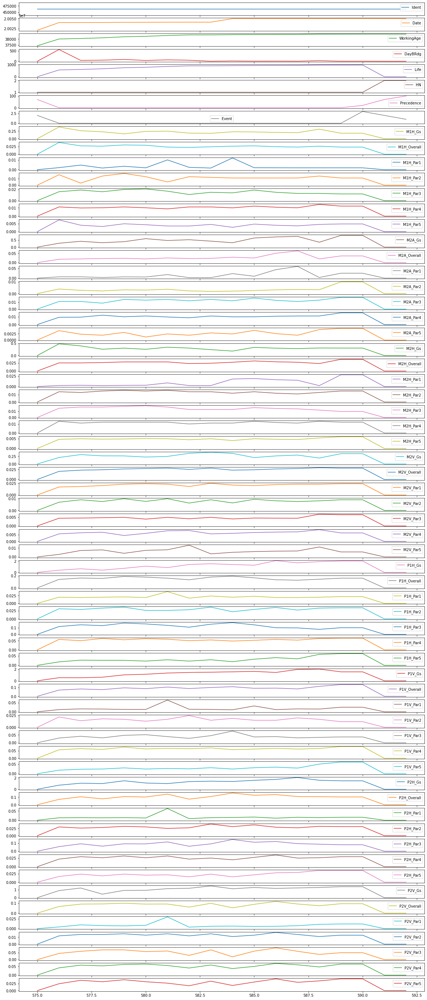

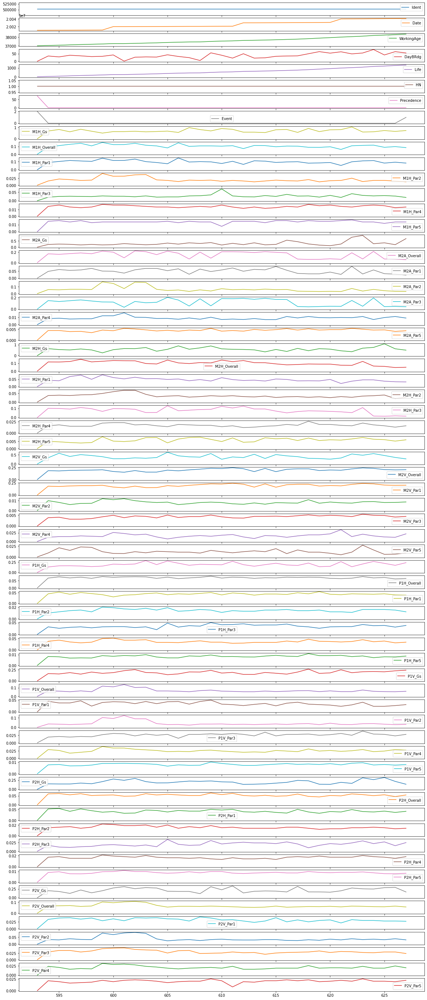

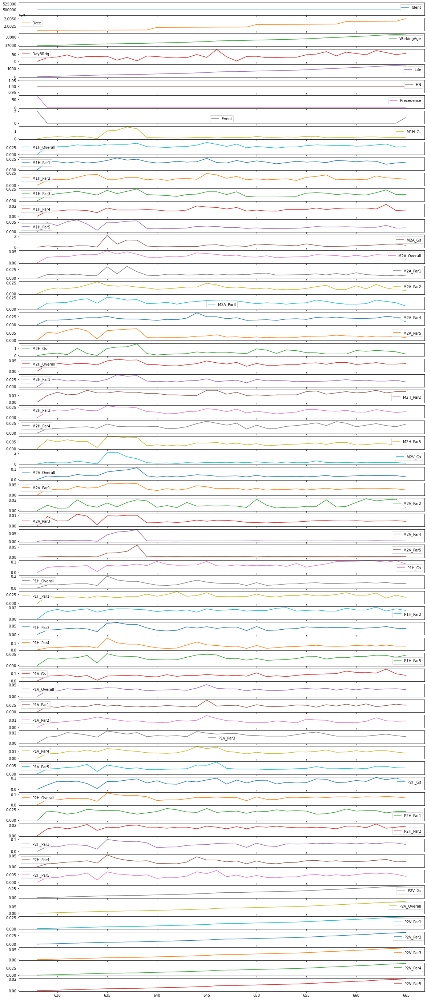

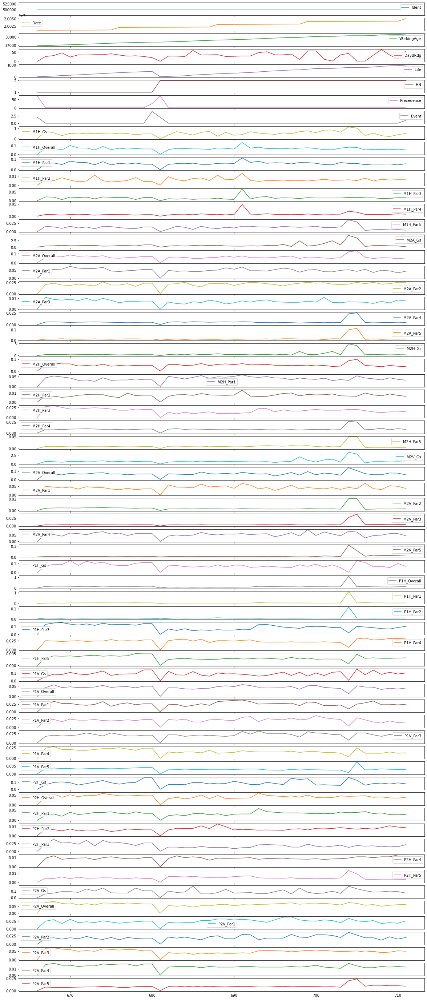

Error in callback <function flush_figures at 0x7fbef63ccdc0> (for post_execute):


KeyboardInterrupt: ignored

In [54]:
working_age_all = []
grouped_by_identification_all = data1.groupby('Ident')
for i in data1['Ident'].unique():
  pump_all = grouped_by_identification_all.get_group(i)
  working_age = pump_all['WorkingAge'].min()
  working_age_all.append(working_age)
  pump_all.plot(subplots =True, sharex = True, figsize = (20,50))